In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns

In [2]:
from matplotlib import pyplot as plt
from shapely import geometry

In [3]:
from scipy.stats import pearsonr as cor

In [4]:
import geopandas as gpd

In [5]:
base = os.path.join(os.getcwd(),'..','compiled values')

In [6]:
shapeFile = os.path.join(os.getcwd(),'..','shape','States_shapefile.shp')

In [7]:
shape = gpd.read_file(shapeFile)

In [8]:
shape.drop(columns=['FID', 'Program', 'State_Code','Flowing_St', 'FID_1'],inplace=True)

In [9]:
shape.rename(columns={'State_Name':'State'},inplace=True)

In [10]:
lp_abgm_ir = pd.read_excel(os.path.join(base,'aboveground_biomassc_irrigated_compiled.xlsx'))
lp_abgm_rf = pd.read_excel(os.path.join(base,'aboveground_biomassc_rainfed_compiled.xlsx'))
rs_gpp = pd.read_excel(os.path.join(base,'CASA_yield.xlsx'))

In [11]:
gpp_grp = os.path.join(base,'gpp graphs')
os.makedirs(gpp_grp,exist_ok=True)

In [12]:
rs_gpp.drop(columns=['Unnamed: 0'],inplace=True)
# rs_gpp.rename(columns={'sum':'GPP'},inplace=True)

In [13]:
yield_data = pd.read_excel(os.path.join(base,'Corn_apy_data.xlsx'))

In [14]:

lp_abgm_ir.rename(columns={'Mean(SO)':'AGBM(IR)','State':'State_Name'},inplace=True)
lp_abgm_ir['year']=lp_abgm_ir['date'].apply(lambda x:x.year)
# lp_abgm_ir['month']=lp_abgm_ir['Date'].apply(lambda x:x.month)
# lp_abgm_ir.drop(columns=['Unnamed: 0','Date'],inplace=True)

lp_abgm_rf.rename(columns={'Mean(SO)':'AGBM(RF)','State':'State_Name'},inplace=True)
lp_abgm_rf['year']=lp_abgm_rf['date'].apply(lambda x:x.year)
# lp_abgm_rf['month']=lp_abgm_rf['Date'].apply(lambda x:x.month)
# lp_abgm_rf.drop(columns=['Unnamed: 0','Date'],inplace=True)

In [15]:
def gen_index(df):
    df['ival']=df['State_Name']+'-'+df['year'].astype(str)
    df.drop(columns=['State_Name','year'],inplace=True)
    if 'date' in df.columns:
        df.drop(columns=['date'],inplace=True)
    return df

In [16]:
lp_abgm_rf = gen_index(lp_abgm_rf)
lp_abgm_ir = gen_index(lp_abgm_ir)
rs_gpp = gen_index(rs_gpp)

In [17]:
lp_abgm_rf.drop(columns=['Unnamed: 0'],inplace=True)
lp_abgm_ir.drop(columns=['Unnamed: 0'],inplace=True)

In [18]:
lp_abgm_rf.columns

Index(['AGBM(RF)', 'ival'], dtype='object')

In [19]:
gpp_compiled = pd.merge(lp_abgm_rf,lp_abgm_ir,on='ival')
gpp_compiled = pd.merge(gpp_compiled,rs_gpp,on='ival')

In [20]:
gpp_compiled.head()

,AGBM(RF),ival,AGBM(IR),RS_yield
0,800.445051,ALABAMA-2010,1232.985962,756.930480
1,NaN,ALASKA-2010,NaN,NaN
2,205.503632,ARIZONA-2010,1440.738113,73.259148
3,639.243258,ARKANSAS-2010,1086.129232,489.275752
4,102.906219,CALIFORNIA-2010,1429.559100,99.210082


In [21]:
gpp_compiled['year']=gpp_compiled['ival'].apply(lambda x:int(x.split('-')[1]))
gpp_compiled['State']=gpp_compiled['ival'].apply(lambda x:(x.split('-')[0]))
gpp_compiled = gpp_compiled.set_index('ival')

In [22]:
gpp_compiled.to_excel(os.path.join(base,'productivity_compiled.xlsx'))

In [23]:
gpp_compiled.columns

Index(['AGBM(RF)', 'AGBM(IR)', 'RS_yield', 'year', 'State'], dtype='object')

In [24]:
gpp_cv=  gpp_compiled.groupby('State').mean()

In [25]:
gpp_cv = gpp_cv.reset_index()

In [26]:
gpp_cv.drop(columns='year',inplace=True)

In [27]:
grp = gpp_compiled.groupby('year')
agbm_rf = pd.DataFrame()
agbm_ir =  pd.DataFrame()
gpp =  pd.DataFrame()
c=0
for d in grp:
    fn = os.path.join(gpp_grp,str(d[0])+'_casa_agbm.shp')
    gdf = shape.merge(d[1],on='State')

    rf = d[1][['State','AGBM(RF)']]
    rf.rename(columns={'AGBM(RF)':d[0]},inplace=True)
    rf.fillna(0,inplace=True)
    
    ir = d[1][['State','AGBM(IR)']]
    ir.rename(columns={'AGBM(IR)':d[0]},inplace=True)
    ir.fillna(0,inplace=True)
    
    gp = d[1][['State','RS_yield']]
    gp.rename(columns={'RS_yield':d[0]},inplace=True)
    gp.fillna(0,inplace=True)

    if c!=0:
        agbm_rf = pd.merge(agbm_rf,rf,on='State')
        agbm_ir = pd.merge(agbm_ir,ir,on='State')
        gpp = pd.merge(gpp,gp,on='State')
    else:
        agbm_rf = rf
        agbm_ir = ir
        gpp = gp
        c+=1
    
    if not os.path.exists(fn):
        gdf.to_file(fn)

In [28]:
gpp_gdf = shape.merge(gpp,on='State',how='left')
agbm_rf_gdf = shape.merge(agbm_rf,on='State',how='left')
agbm_ir_gdf = shape.merge(agbm_ir,on='State',how='left')

In [29]:
cols = range(2010,2020)

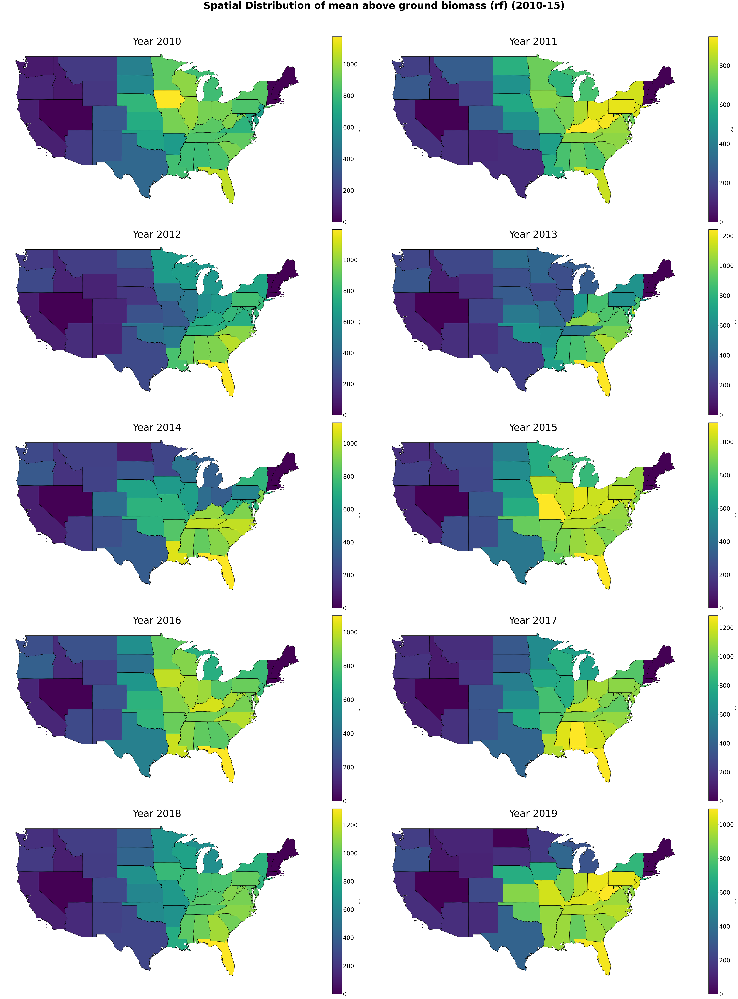

In [30]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(55, 70))
axes = axes.flatten()

for i, col in enumerate(cols):
    gdf = agbm_rf_gdf
    gdf = gdf[(gdf['State']!='ALASKA') & (gdf['State']!='HAWAII')]
    gdf.plot(
        column=col,
        ax=axes[i],
        cmap='viridis',
        legend=True,
        edgecolor='black',        
        legend_kwds={
            'label': col,
            'orientation': 'vertical'
        }
    )    
    
    cbar = axes[i].get_figure().axes[-1]
    cbar.tick_params(labelsize=30)
    
    axes[i].set_title('Year '+str(col), fontsize=50)
    axes[i].axis('off')
    
fig.suptitle(
    "Spatial Distribution of mean above ground biomass (rf) (2010-15)",
    fontsize=50,
    fontweight='bold',
    y=1.02  
)    
plt.tight_layout()
fn = os.path.join(gpp_grp,'SD_abgbm_rf.png')
plt.savefig(fn, bbox_inches='tight',dpi=300)
plt.show()

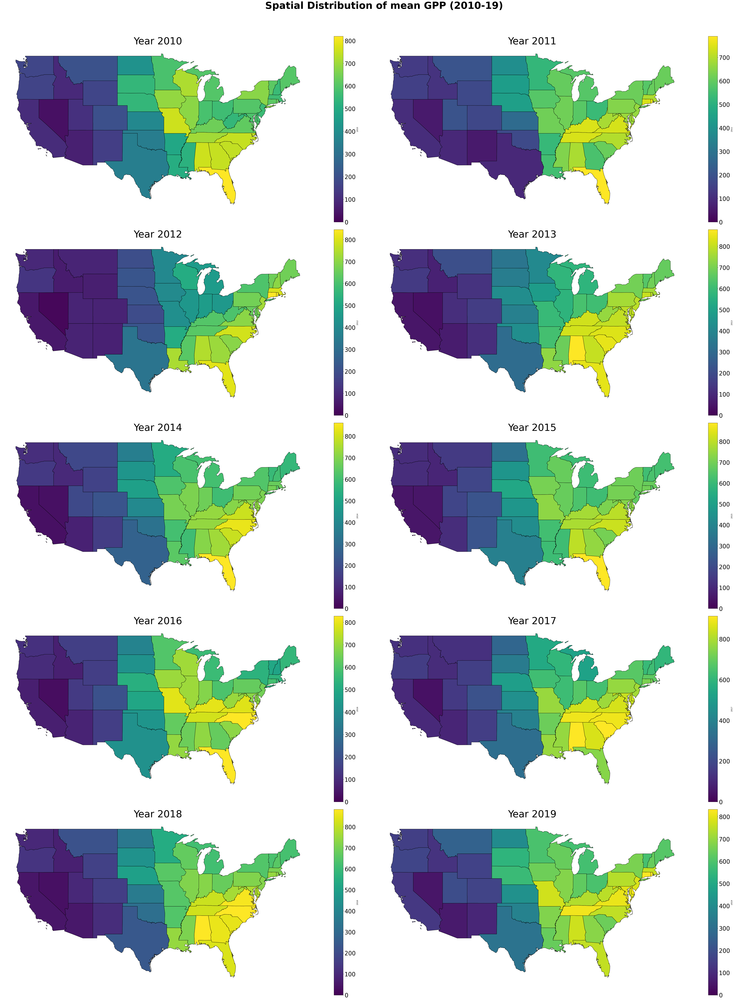

In [31]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(55, 70))
axes = axes.flatten()

for i, col in enumerate(cols):
    gdf = gpp_gdf
    gdf = gdf[(gdf['State']!='ALASKA') & (gdf['State']!='HAWAII')]
    gdf.plot(
        column=col,
        ax=axes[i],
        cmap='viridis',
        legend=True,
        edgecolor='black',        
        legend_kwds={
            'label': col,
            'orientation': 'vertical'
        }
    )    
    
    cbar = axes[i].get_figure().axes[-1]
    cbar.tick_params(labelsize=30)
    
    axes[i].set_title('Year '+str(col), fontsize=50)
    axes[i].axis('off')
    
fig.suptitle(
    "Spatial Distribution of mean GPP (2010-19)",
    fontsize=50,
    fontweight='bold',
    y=1.02  
)    
plt.tight_layout()
fn = os.path.join(gpp_grp,'SD_gpp_rs.png')
plt.savefig(fn, bbox_inches='tight',dpi=300)
plt.show()

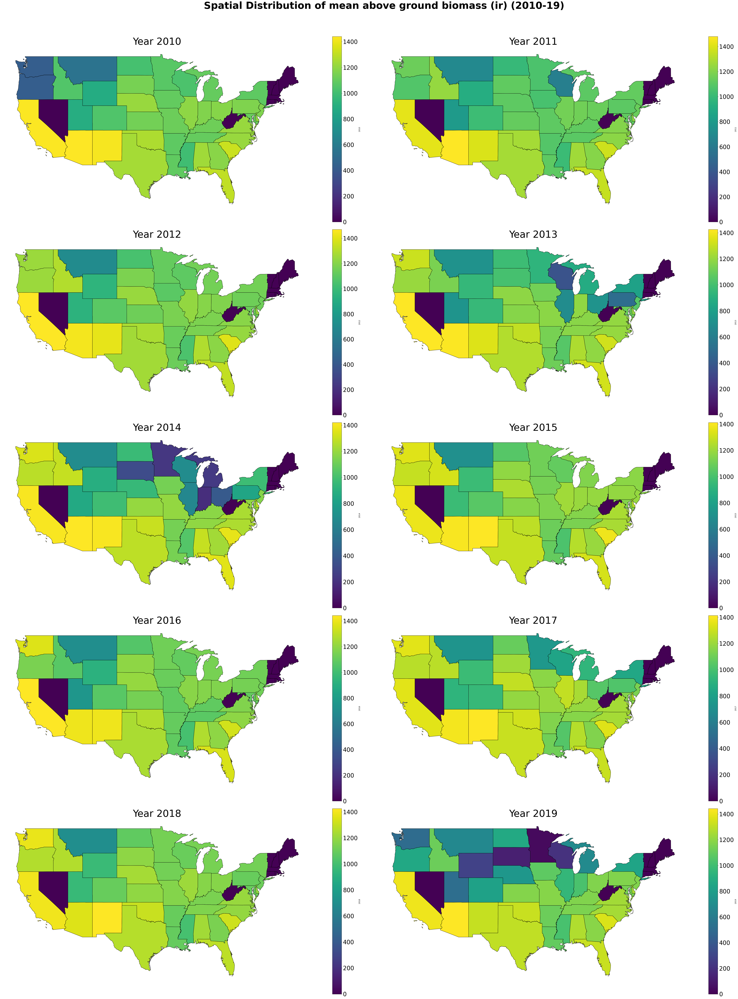

In [32]:
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(55, 70))
axes = axes.flatten()

for i, col in enumerate(cols):
    gdf = agbm_ir_gdf
    gdf = gdf[(gdf['State']!='ALASKA') & (gdf['State']!='HAWAII')]
    gdf.plot(
        column=col,
        ax=axes[i],
        cmap='viridis',
        legend=True,
        edgecolor='black',        
        legend_kwds={
            'label': col,
            'orientation': 'vertical'
        }
    )    
    
    cbar = axes[i].get_figure().axes[-1]
    cbar.tick_params(labelsize=30)
    
    axes[i].set_title('Year '+str(col), fontsize=50)
    axes[i].axis('off')
    
fig.suptitle(
    "Spatial Distribution of mean above ground biomass (ir) (2010-19)",
    fontsize=50,
    fontweight='bold',
    y=1.02  
)    
plt.tight_layout()
fn = os.path.join(gpp_grp,'SD_abgbm_ir.png')
plt.savefig(fn, bbox_inches='tight',dpi=300)
plt.show()

In [33]:
gpp_compiled_cs = gpp_compiled

In [34]:
gpp_compiled.columns

Index(['AGBM(RF)', 'AGBM(IR)', 'RS_yield', 'year', 'State'], dtype='object')

In [35]:
state = []
ir_lai = []
rf_lai = []
for d in gpp_compiled.groupby('State'):
    state.append(d[0])
    d[1].dropna(inplace=True)
    if d[1].shape[0]>2:
        ir_lai.append(cor(d[1]['AGBM(IR)'],d[1]['RS_yield'])[0])
        rf_lai.append(cor(d[1]['AGBM(RF)'],d[1]['RS_yield'])[0])
    else:
        ir_lai.append(np.nan)
        rf_lai.append(np.nan)
df_corr = pd.DataFrame()
df_corr['State'] = state
df_corr['RS-IR'] = ir_lai
df_corr['RS-RF'] = rf_lai

In [36]:
gdf_corr = shape.merge(df_corr,on='State',how='left')

In [37]:
cols_corr = ['RS-IR', 'RS-RF']

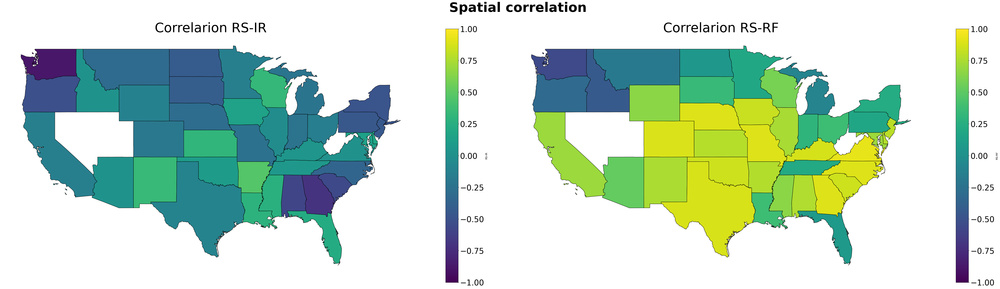

In [38]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(55, 15))
axes = axes.flatten()
vmax=1
vmin=-1
for i, col in enumerate(cols_corr):
    gdf = gdf_corr
    gdf = gdf[(gdf['State']!='ALASKA') & (gdf['State']!='HAWAII')]
    gdf.plot(
        column=col,
        ax=axes[i],
        cmap='viridis',
        legend=True,
        vmax=vmax,
        vmin=vmin,
        edgecolor='black',        
        legend_kwds={
            'label': col,
            'orientation': 'vertical'
        }
    )    
    
    cbar = axes[i].get_figure().axes[-1]
    cbar.tick_params(labelsize=30)
    
    axes[i].set_title('Correlarion '+str(col), fontsize=50)
    axes[i].axis('off')
    
fig.suptitle(
    "Spatial correlation",
    fontsize=50,
    fontweight='bold',
    y=1.02  
)    
plt.tight_layout()
fn = os.path.join(gpp_grp,'SD_AGBM_correlation.png')
plt.savefig(fn, bbox_inches='tight',dpi=300)
plt.show()


In [39]:
df_agg_gs = gpp_compiled
df_agg_gs = df_agg_gs.reset_index()
df_agg_gs['State_Name'] = df_agg_gs['year'].astype(str)+'-'+df_agg_gs['State']

In [40]:
df_agg = df_agg_gs

In [41]:
yield_data_sub = yield_data[['State_Name','PRODUCTION in BU','YIELD in BU / ACRE', 'NDVI_4', 'NDVI_5', 'NDVI_6', 'NDVI_7', 'NDVI_8']]

In [42]:
df_agg['State_Name'] = df_agg['year'].astype(str)+'-'+df_agg['State']

In [43]:
major_corn = ['IOWA','ILLINOIS','NEBRASKA','MINNESOTA','INDIANA']
df_agg_mc = df_agg[df_agg['State'].isin(major_corn)]
df_agg_gs_mc = df_agg_gs[df_agg_gs['State'].isin(major_corn)]

In [44]:
df_merged = pd.merge(yield_data_sub,df_agg,on='State_Name')
df_merged_gs = pd.merge(yield_data_sub,df_agg_gs,on='State_Name')

In [45]:
df_merged_mc = pd.merge(yield_data_sub,df_agg_mc,on='State_Name')
df_merged_gs_mc = pd.merge(yield_data_sub,df_agg_gs_mc,on='State_Name')

In [46]:
# df_merged_mc['GPP'] = df_merged_mc['GPP']/10000
# df_merged_gs_mc['GPP'] = df_merged_gs_mc['GPP']/10000

In [47]:
# df_merged['GPP'] = df_merged['GPP']/10000
# df_merged_gs['GPP'] = df_merged_gs['GPP']/10000

In [58]:
# col1 = ['YIELD in BU / ACRE', 'NDVI_4','NDVI_5', 'NDVI_6', 'NDVI_7', 'NDVI_8']
col1 = ['YIELD in BU / ACRE']
col2 = [ 'AGBM(RF)','AGBM(IR)', 'RS_yield']

In [59]:
df_merged_gs_mc.columns

Index(['State_Name', 'PRODUCTION in BU', 'YIELD in BU / ACRE', 'NDVI_4',
       'NDVI_5', 'NDVI_6', 'NDVI_7', 'NDVI_8', 'ival', 'AGBM(RF)', 'AGBM(IR)',
       'RS_yield', 'year', 'State'],
      dtype='object')

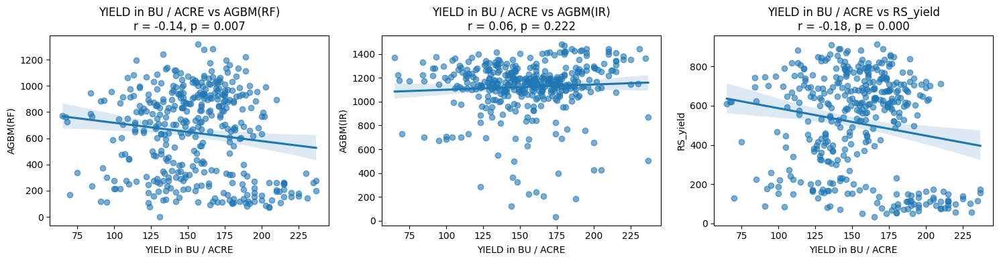

In [60]:
df_clean = df_merged[col1 + col2].dropna()

nrows = len(col1)
ncols = len(col2)

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))

for i, c1 in enumerate(col1):
    for j, c2 in enumerate(col2):
        ax = axes[i, j] if nrows > 1 else axes[j]
        
        x = df_clean[c1]
        y = df_clean[c2]
        
        # Compute correlation
        r, p = cor(x, y)
        
        # Plot
        sns.regplot(x=x, y=y, ax=ax, scatter_kws={'alpha':0.6})
        
        ax.set_title(f"{c1} vs {c2}\nr = {r:.2f}, p = {p:.3f}")
        ax.set_xlabel(c1)
        ax.set_ylabel(c2)

plt.tight_layout()
fn = os.path.join(gpp_grp,'Correaltion_graph(agbm-casa).png')
plt.savefig(fn, bbox_inches='tight',dpi=300)
plt.show()

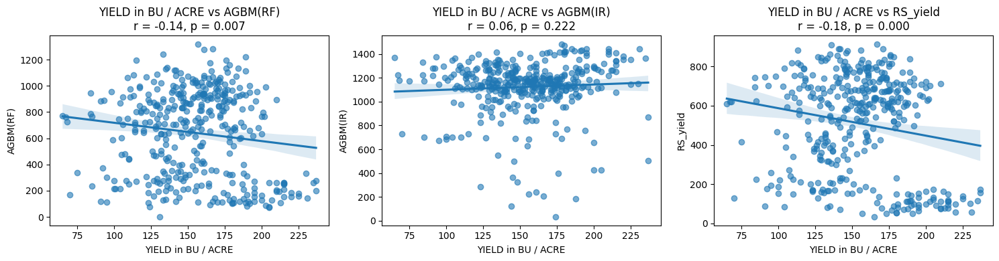

In [61]:
df_clean = df_merged_gs[col1 + col2].dropna()

nrows = len(col1)
ncols = len(col2)

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))

for i, c1 in enumerate(col1):
    for j, c2 in enumerate(col2):
        ax = axes[i, j] if nrows > 1 else axes[j]
        
        x = df_clean[c1]
        y = df_clean[c2]
        
        # Compute correlation
        r, p = cor(x, y)
        
        # Plot
        sns.regplot(x=x, y=y, ax=ax, scatter_kws={'alpha':0.6})
        
        ax.set_title(f"{c1} vs {c2}\nr = {r:.2f}, p = {p:.3f}")
        ax.set_xlabel(c1)
        ax.set_ylabel(c2)

plt.tight_layout()  
# fn = os.path.join(gpp_grp,'Correaltion_graph_growing season.png')
# plt.savefig(fn, bbox_inches='tight',dpi=300)
plt.show()

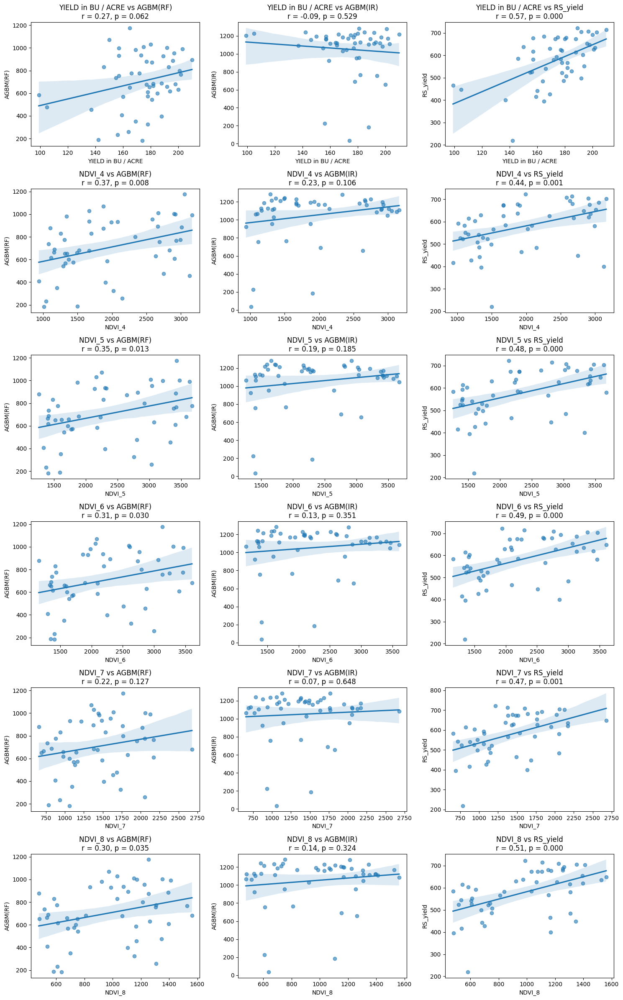

In [52]:
df_clean = df_merged_gs_mc[col1 + col2].dropna()

nrows = len(col1)
ncols = len(col2)

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))

for i, c1 in enumerate(col1):
    for j, c2 in enumerate(col2):
        ax = axes[i, j] if nrows > 1 else axes[j]
        
        x = df_clean[c1]
        y = df_clean[c2]
        
        # Compute correlation
        r, p = cor(x, y)
        
        # Plot
        sns.regplot(x=x, y=y, ax=ax, scatter_kws={'alpha':0.6})
        
        ax.set_title(f"{c1} vs {c2}\nr = {r:.2f}, p = {p:.3f}")
        ax.set_xlabel(c1)
        ax.set_ylabel(c2)

plt.tight_layout()
# fn = os.path.join(gpp_grp,'Correlation_graph_growing season(major corn).png')
# plt.savefig(fn, bbox_inches='tight',dpi=600)
plt.show()

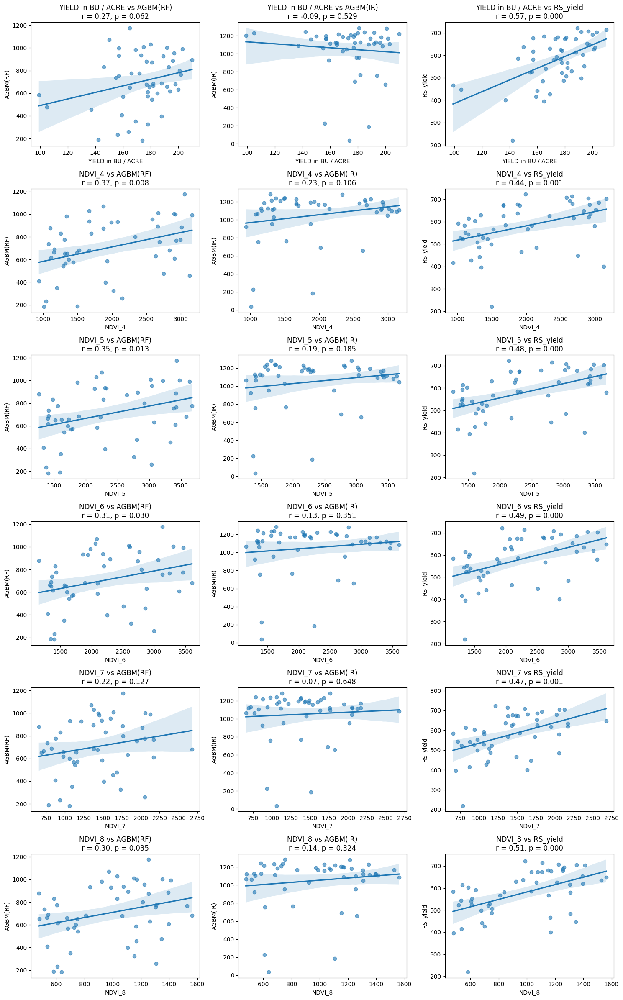

In [53]:
df_clean = df_merged_mc[col1 + col2].dropna()

nrows = len(col1)
ncols = len(col2)

fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))

for i, c1 in enumerate(col1):
    for j, c2 in enumerate(col2):
        ax = axes[i, j] if nrows > 1 else axes[j]
        
        x = df_clean[c1]
        y = df_clean[c2]
        
        r, p = cor(x, y)
        
        sns.regplot(x=x, y=y, ax=ax, scatter_kws={'alpha':0.6})
        
        ax.set_title(f"{c1} vs {c2}\nr = {r:.2f}, p = {p:.3f}")
        ax.set_xlabel(c1)
        ax.set_ylabel(c2)

plt.tight_layout()
fn = os.path.join(gpp_grp,'Correlation_graph(major corn)(agbm-casa).png')
plt.savefig(fn, bbox_inches='tight',dpi=300)
plt.show()

In [54]:
iowa = df_merged_gs_mc[df_merged_gs_mc['State']=='IOWA']

In [55]:
iowa_sub = iowa[['YIELD in BU / ACRE','AGBM(RF)', 'AGBM(IR)','RS_yield', 'year']]

In [56]:
iowa_sub['Yield']=iowa_sub['YIELD in BU / ACRE']*6.7
iowa_sub.drop(columns=['YIELD in BU / ACRE'],inplace=True)
iowa_sub=iowa_sub.set_index('year')

<Axes: xlabel='year'>

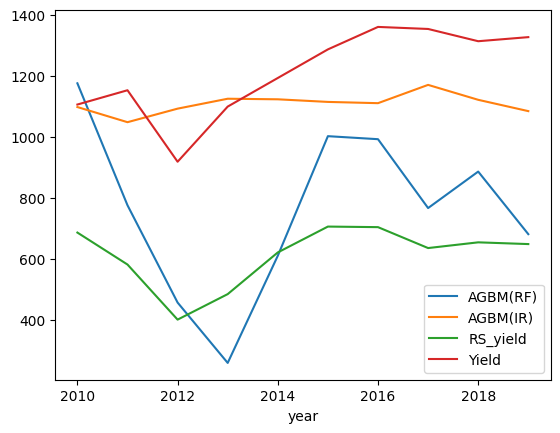

In [57]:
iowa_sub.plot()